# Análise Concessão de Crédito
---

## Introdução  

A concessão de crédito é um dos principais desafios enfrentados por instituições financeiras, exigindo métodos eficazes para avaliar o risco de inadimplência dos clientes. Este projeto tem como objetivo desenvolver um modelo de **credit scoring** para cartões de crédito, utilizando um conjunto de dados estruturado em **15 safras** e considerando **12 meses de performance**.  

A análise será baseada em variáveis históricas dos clientes, permitindo a identificação de padrões de comportamento financeiro e a previsão da capacidade de cumprimento de compromissos financeiros. O modelo gerado poderá auxiliar na tomada de decisão sobre a concessão de crédito, contribuindo para uma gestão mais eficiente do risco e para a redução de perdas financeiras.  


## Import das Bibliotecas e pacotes

In [1]:
import numpy as np
import pandas as pd

# Visualização
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Estatística e testes
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.stats import ks_2samp, t
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif

# Machine Learning
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from pycaret.classification import setup

# Exemplo de dataset
from sklearn.datasets import load_digits


## Carregando a base de Dados

In [2]:
# Carregando a base de Dados
df = pd.read_feather('credit_scoring.ftr')

# Certificando que a variável data_ref está no formato datetime e colocando-a como índice
df['data_ref'] = pd.to_datetime(df['data_ref'])
df.set_index('data_ref', inplace=True)


# Exibindo o número de linhas e colunas da base de Dados
print('numero de linhas: {0} \nnúmero de colunas: {1}'.format(df.shape[0], df.shape[1]))
df.mau.value_counts(normalize=True)

# Visualizando as primeiras linhas do DataFrame
df.head()

numero de linhas: 750000 
número de colunas: 14


,index,sexo,posse_de_veiculo,posse_de_imovel,qtd_filhos,tipo_renda,educacao,estado_civil,tipo_residencia,idade,tempo_emprego,qt_pessoas_residencia,renda,mau
data_ref,,,,,,,,,,,,,,
2015-01-01,5733,F,N,N,0,Empresário,Médio,Solteiro,Casa,43,6.873973,1.0,2515.39,False
2015-01-01,727,F,S,S,0,Assalariado,Médio,Casado,Casa,35,4.526027,2.0,3180.19,False
2015-01-01,6374,F,N,N,2,Assalariado,Médio,Casado,Casa,31,0.243836,4.0,1582.29,False
2015-01-01,9566,F,N,N,0,Assalariado,Médio,Casado,Casa,54,12.772603,2.0,13721.17,False
2015-01-01,9502,F,S,N,0,Assalariado,Superior incompleto,Solteiro,Casa,31,8.432877,1.0,2891.08,False


## Amostragem

Separe os três últimos meses como safras de validação *out of time* (OOT), excluindo as variáveis `data_ref` e `index`, pois elas não possuem caráter explicativo e não devem ser utilizadas na previsão de inadimplência.

In [3]:
# Garantindo que o índice seja datetime
df.index = pd.to_datetime(df.index)

# Encontrando os meses únicos ordenados
meses_unicos = df.index.to_period('M').sort_values().unique()

# Selecionando os últimos 3 meses
ultimos_3_meses = meses_unicos[-3:]

# Filtrando o DataFrame para incluir apenas os últimos 3 meses
df_val = df[df.index.to_period('M').isin(ultimos_3_meses)].drop(columns='index')

# Exibindo o DataFrame resultante
df_val.head()

,sexo,posse_de_veiculo,posse_de_imovel,qtd_filhos,tipo_renda,educacao,estado_civil,tipo_residencia,idade,tempo_emprego,qt_pessoas_residencia,renda,mau
data_ref,,,,,,,,,,,,,
2016-01-01,F,S,S,2,Assalariado,Superior completo,Casado,Casa,38,7.383562,4.0,2969.49,True
2016-01-01,F,N,S,0,Assalariado,Médio,Casado,Casa,55,8.471233,2.0,6278.37,False
2016-01-01,M,S,S,1,Assalariado,Médio,União,Casa,39,8.884932,3.0,14010.18,False
2016-01-01,F,N,S,1,Assalariado,Médio,União,Com os pais,31,1.794521,3.0,2875.81,False
2016-01-01,M,S,N,0,Assalariado,Médio,Casado,Casa,27,7.019178,2.0,2737.19,False


In [4]:
df_val.shape

(150000, 13)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 750000 entries, 2015-01-01 to 2016-03-01
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   index                  750000 non-null  int64  
 1   sexo                   750000 non-null  object 
 2   posse_de_veiculo       750000 non-null  object 
 3   posse_de_imovel        750000 non-null  object 
 4   qtd_filhos             750000 non-null  int64  
 5   tipo_renda             750000 non-null  object 
 6   educacao               750000 non-null  object 
 7   estado_civil           750000 non-null  object 
 8   tipo_residencia        750000 non-null  object 
 9   idade                  750000 non-null  int64  
 10  tempo_emprego          624043 non-null  float64
 11  qt_pessoas_residencia  750000 non-null  float64
 12  renda                  750000 non-null  float64
 13  mau                    750000 non-null  bool   
dtypes: bool(1), float64(

O dataset em questão possui 150.000 observações e 15 variáveis, sendo uma variável booleana (variável alvo), 7 variáveis categóricas (sexo, posse_de_veiculo, posse_de_imovel, tipo_renda, educacao, estado_civil e tipo_re) e 6 variáveis numéricas (index, qtd_filhos, idade, tempo_emprego, qt_pessoas_residencia e renda). A variável tempo_emprego é a única que apresenta dados faltantes. Para lidar com essa questão, os valores faltantes serão imputados utilizando a média da variável. Essa técnica é uma abordagem comum para preencher lacunas nos dados, mas outras estratégias podem ser exploradas dependendo da análise em questão

## Descritiva básica univariada

Nesta etapa do projeto, iremos analisar a base de dados considerando dois aspectos principais: primeiro, identificaremos o número total de registros e a distribuição de linhas por mês na variável `data_ref`. Em seguida, realizaremos uma análise descritiva univariada, diferenciando as variáveis de acordo com sua natureza – **qualitativas** (categóricas) e **quantitativas** (numéricas) – para entender melhor suas distribuições e possíveis padrões.

## Número de linhas para cada mês em ```data_ref```

In [6]:
# Encontrar os meses únicos ordenados
meses_unicos = df.index.to_period('M').sort_values().unique()

# Selecionar os últimos 3 meses
ultimos_3_meses = meses_unicos[-3:]

# Filtrar o DataFrame para incluir apenas os últimos 3 meses
df_val = df[df.index.to_period('M').isin(ultimos_3_meses)].copy()  # Fazer uma cópia para evitar problemas futuros

# Adicionar a coluna com o número do mês
df_val['mes'] = df_val.index.month

# Contar o número de linhas por mês
contagem_mensal = df_val.groupby('mes').size()

# Exibir o resultado
contagem_mensal


,0
mes,
1,50000
2,50000
3,50000


A base de dados, referente ao período de Janeiro de 2016 a Março de 2016, apresenta uma distribuição homogênea de linhas entre os meses analisados, com  50.000 linhas por mês. Esse equilíbrio é crucial para garantir que a análise dos dados não seja influenciada por uma representação desproporcional de determinados meses, assegurando a confiabilidade e a precisão dos resultados obtidos.

In [7]:
# Criando um DataFrame chamado 'metadados' para armazenar informações sobre as colunas do DataFrame original

# Obtendo os tipos de dados de cada coluna
metadados = pd.DataFrame(df.dtypes, columns=['dtype'])

# Adicionando uma coluna com a contagem de valores ausentes (NaN) em cada coluna
metadados['nmissing'] = df.isna().sum()

# Adicionando uma coluna com a contagem de valores únicos em cada coluna
metadados['valores_unicos'] = df.nunique()

# Criando uma coluna 'papel' e definir todas as variáveis inicialmente como 'covariavel' (variáveis independentes)
metadados['papel'] = 'covariavel'

# Alterar o valor da coluna 'papel' para 'resposta' nas linhas correspondentes às variáveis-alvo (variáveis dependentes)
metadados.loc['mau', 'papel'] = 'resposta'  # Define 'mau' como variável de resposta
metadados.loc['bom', 'papel'] = 'resposta'  # Define 'bom' como variável de resposta (parece um erro, pois 'bom' pode não existir no dataset)

# Exibir o DataFrame resultante com os metadados das colunas
metadados


,dtype,nmissing,valores_unicos,papel
index,int64,0.0,16650.0,covariavel
sexo,object,0.0,2.0,covariavel
posse_de_veiculo,object,0.0,2.0,covariavel
posse_de_imovel,object,0.0,2.0,covariavel
qtd_filhos,int64,0.0,8.0,covariavel
tipo_renda,object,0.0,5.0,covariavel
educacao,object,0.0,5.0,covariavel
estado_civil,object,0.0,5.0,covariavel
tipo_residencia,object,0.0,6.0,covariavel
idade,int64,0.0,47.0,covariavel


## Descritiva bivariada

Faça uma análise descritiva bivariada de cada variável

In [8]:
def IV(variavel, resposta):
    tab = pd.crosstab(variavel, resposta, margins=True, margins_name='total')

    rótulo_evento = tab.columns[0]
    rótulo_nao_evento = tab.columns[1]

    tab['pct_evento'] = tab[rótulo_evento]/tab.loc['total',rótulo_evento]
    tab['ep'] = tab[rótulo_evento]/tab.loc['total',rótulo_evento]

    tab['pct_nao_evento'] = tab[rótulo_nao_evento]/tab.loc['total',rótulo_nao_evento]
    tab['woe'] = np.log(tab.pct_evento/tab.pct_nao_evento)
    tab['iv_parcial'] = (tab.pct_evento - tab.pct_nao_evento)*tab.woe
    return tab['iv_parcial'].sum()

In [9]:
for var in metadados[metadados.papel=='covariavel'].index:
    if  (metadados.loc[var, 'valores_unicos']>6):
        metadados.loc[var, 'IV'] = IV(pd.qcut(df[var],5,duplicates='drop'), df.mau)
    else:
        metadados.loc[var, 'IV'] = IV(df[var], df.mau)


metadados

,dtype,nmissing,valores_unicos,papel,IV
index,int64,0.0,16650.0,covariavel,0.002664
sexo,object,0.0,2.0,covariavel,0.002185
posse_de_veiculo,object,0.0,2.0,covariavel,0.000108
posse_de_imovel,object,0.0,2.0,covariavel,0.009693
qtd_filhos,int64,0.0,8.0,covariavel,0.000030
tipo_renda,object,0.0,5.0,covariavel,0.009360
educacao,object,0.0,5.0,covariavel,0.003547
estado_civil,object,0.0,5.0,covariavel,0.001126
tipo_residencia,object,0.0,6.0,covariavel,0.003045
idade,int64,0.0,47.0,covariavel,0.017968


## Criando funções para plotar gráficos

Iremos utilizar duas funções para visualizar a análise descritiva das variáveis do nosso DataFrame. Antes de gerar os gráficos, aplicaremos um filtro com `qcut` para identificar as variáveis com muitos valores únicos, classificando-as como contínuas.

In [10]:
def biv_discreta(var, df):
    df['bom'] = 1-df.mau
    g = df.groupby(var)

    biv = pd.DataFrame({'qt_bom': g['bom'].sum(),
                        'qt_mau': g['mau'].sum(),
                        'mau':g['mau'].mean(),
                        var: g['mau'].mean().index,
                        'cont':g[var].count()})

    biv['ep'] = (biv.mau*(1-biv.mau)/biv.cont)**.5
    biv['mau_sup'] = biv.mau+t.ppf([0.975], biv.cont-1)*biv.ep
    biv['mau_inf'] = biv.mau+t.ppf([0.025], biv.cont-1)*biv.ep

    biv['logit'] = np.log(biv.mau/(1-biv.mau))
    biv['logit_sup'] = np.log(biv.mau_sup/(1-biv.mau_sup))
    biv['logit_inf'] = np.log(biv.mau_inf/(1-biv.mau_inf))

    tx_mau_geral = df.mau.mean()
    woe_geral = np.log(df.mau.mean() / (1 - df.mau.mean()))

    biv['woe'] = biv.logit - woe_geral
    biv['woe_sup'] = biv.logit_sup - woe_geral
    biv['woe_inf'] = biv.logit_inf - woe_geral

    fig, ax = plt.subplots(2,1, figsize=(8,6))
    plt .subplots_adjust(hspace= 0.5)
    ax[0].plot(biv[var], biv.woe, ':bo', label='woe')
    ax[0].plot(biv[var], biv.woe_sup, 'o:r', label='limite superior')
    ax[0].plot(biv[var], biv.woe_inf, 'o:r', label='limite inferior')

    num_cat = biv.shape[0]
    ax[0].set_xlim([-.3, num_cat-.7])

    ax[0].set_ylabel("Weight of Evidence")
    ax[0].legend(bbox_to_anchor=(.83, 1.17), ncol=3)

    ax[0].set_xticks(list(range(num_cat)))
    ax[0].set_xticklabels(biv[var], rotation=15)

    ax[1] = biv.cont.plot.bar()
    return biv

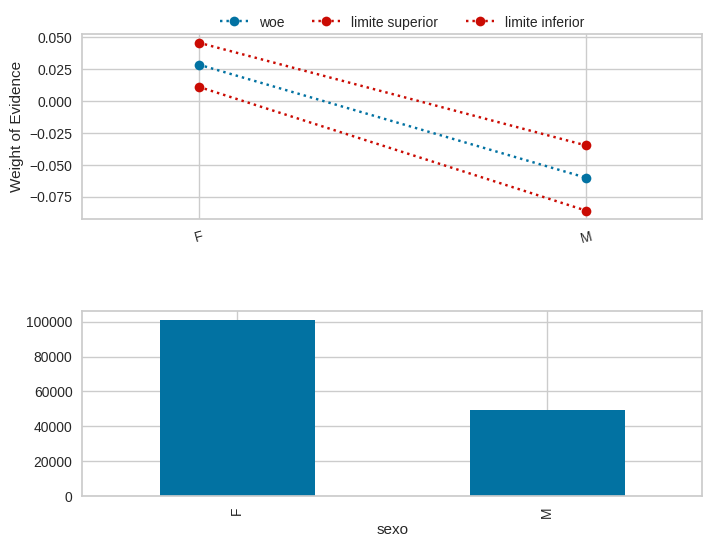

In [11]:
biv_discreta('sexo', df_val);

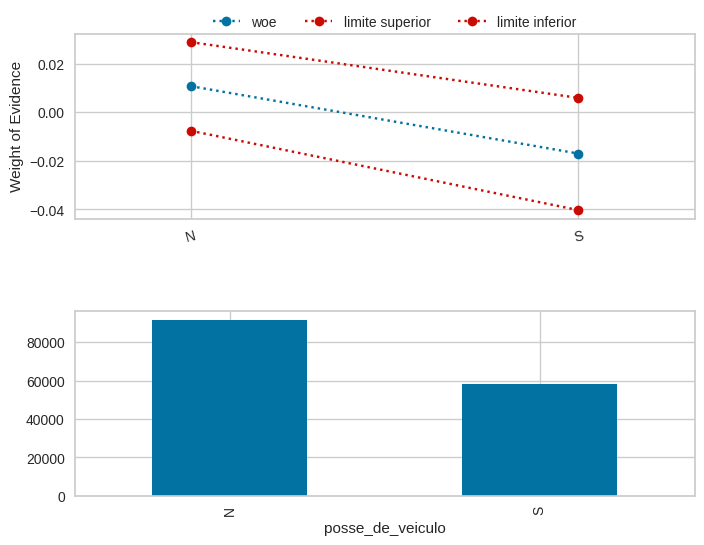

In [12]:
biv_discreta('posse_de_veiculo', df_val);

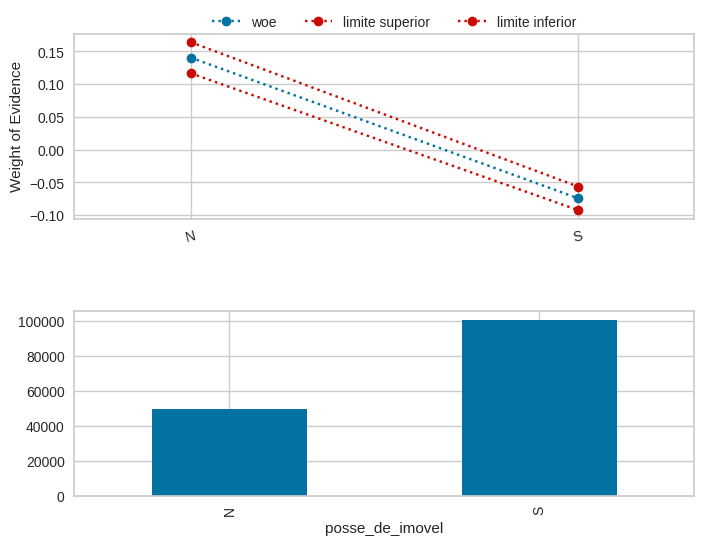

In [13]:
biv_discreta('posse_de_imovel', df_val);

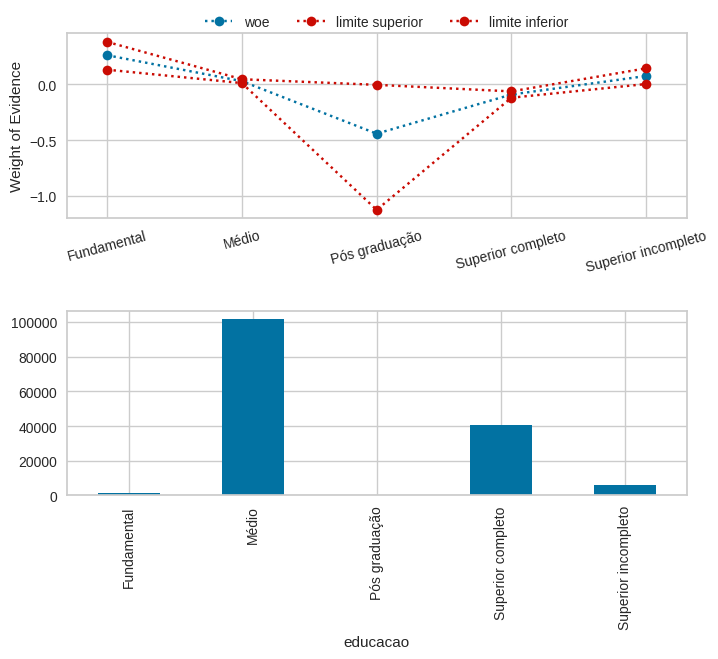

In [14]:
biv_discreta('educacao', df_val);

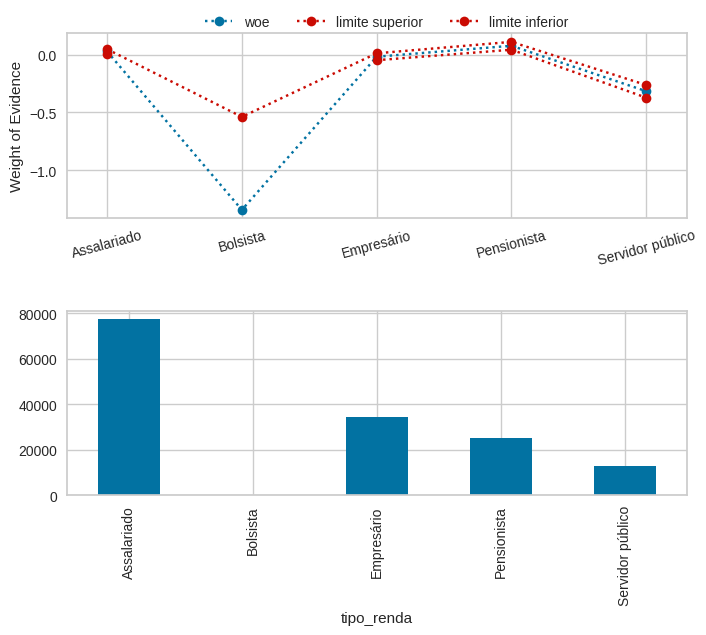

In [15]:
biv_discreta('tipo_renda', df_val);

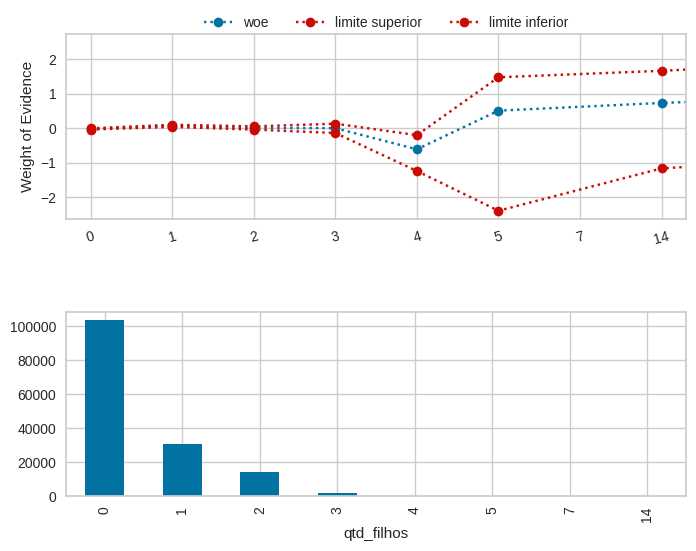

In [16]:
biv_discreta('qtd_filhos', df_val);


In [17]:

def biv_continua(var, ncat, df):
    df['bom'] = 1-df.mau
    cat_srs, bins = pd.qcut(df[var], ncat, retbins=True, precision=0, duplicates='drop')
    g = df.groupby(cat_srs, observed=True)

    biv = pd.DataFrame({'qt_bom': g['bom'].sum(),
                        'qt_mau': g['mau'].sum(),
                        'mau':g['mau'].mean(),
                        var: g[var].mean(),
                        'cont':g[var].count()})

    biv['ep'] = (biv.mau*(1-biv.mau)/biv.cont)**.5
    biv['mau_sup'] = biv.mau+t.ppf([0.975], biv.cont-1)*biv.ep
    biv['mau_inf'] = biv.mau+t.ppf([0.025], biv.cont-1)*biv.ep

    biv['logit'] = np.log(biv.mau/(1-biv.mau))
    biv['logit_sup'] = np.log(biv.mau_sup/(1-biv.mau_sup))
    biv['logit_inf'] = np.log(biv.mau_inf/(1-biv.mau_inf))

    tx_mau_geral = df.mau.mean()
    woe_geral = np.log(df.mau.mean() / (1 - df.mau.mean()))

    biv['woe'] = biv.logit - woe_geral
    biv['woe_sup'] = biv.logit_sup - woe_geral
    biv['woe_inf'] = biv.logit_inf - woe_geral

    fig, ax = plt.subplots(2,1, figsize=(8,6))
    ax[0].plot(biv[var], biv.woe, ':bo', label='woe')
    ax[0].plot(biv[var], biv.woe_sup, 'o:r', label='limite superior')
    ax[0].plot(biv[var], biv.woe_inf, 'o:r', label='limite inferior')

    num_cat = biv.shape[0]

    ax[0].set_ylabel("Weight of Evidence")
    ax[0].legend(bbox_to_anchor=(.83, 1.17), ncol=3)

    ax[1] = biv.cont.plot.bar()
    return None

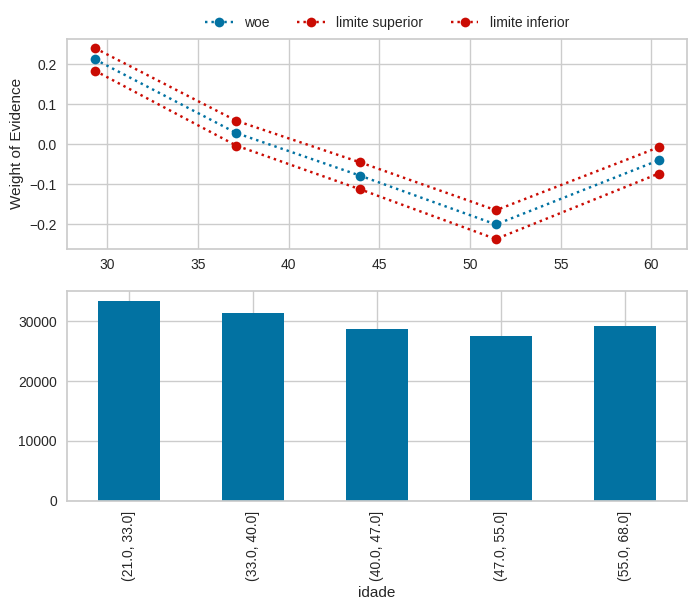

In [18]:
biv_continua('idade', 5,  df_val)


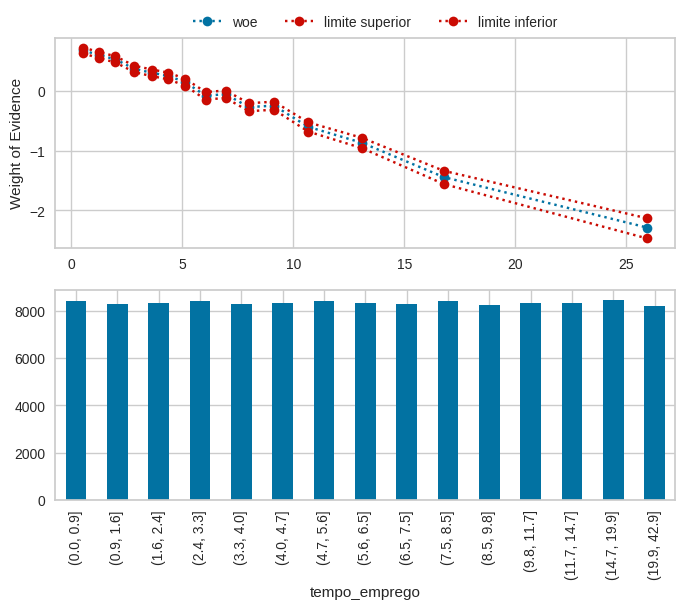

In [19]:
biv_continua('tempo_emprego', 15,  df_val)


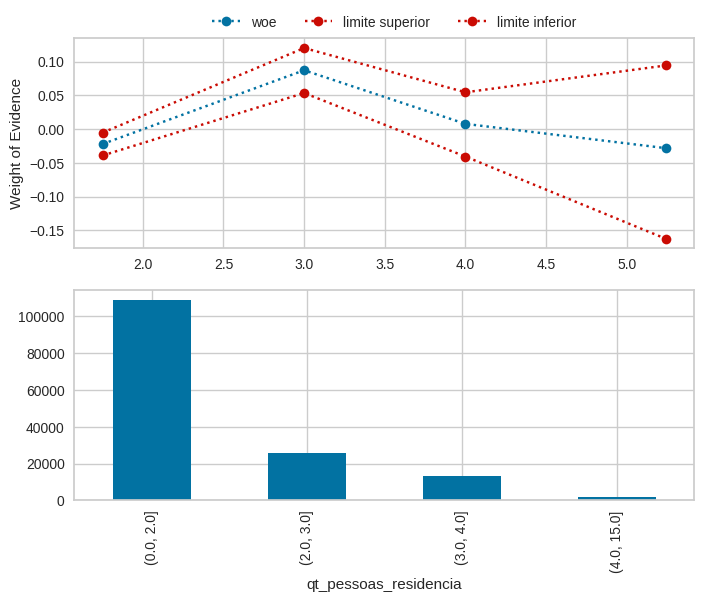

In [20]:
biv_continua('qt_pessoas_residencia', 10,  df_val)


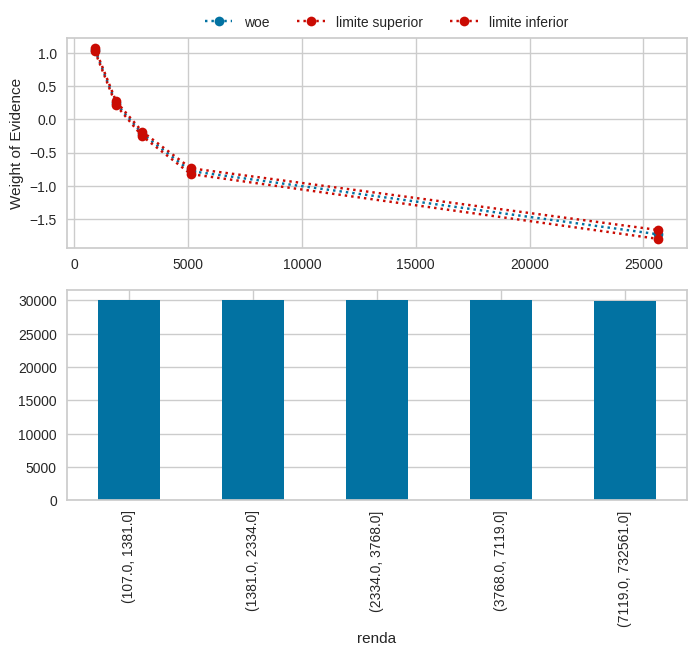

In [21]:
biv_continua('renda', 5,  df_val)

## Desenvolvimento do modelo

Desenvolva um modelo de *credit scoring* através de uma regressão logística.

- Trate valores missings e outliers
- Trate 'zeros estruturais'
- Faça agrupamentos de categorias conforme vimos em aula
- Proponha uma equação preditiva para 'mau'
- Caso hajam categorias não significantes, justifique

## Trate valores missings e outliers


In [22]:
df_val.isna().sum()

,0
index,0
sexo,0
posse_de_veiculo,0
posse_de_imovel,0
qtd_filhos,0
tipo_renda,0
educacao,0
estado_civil,0
tipo_residencia,0
idade,0


In [23]:
# Substituindo os valores de tempo_emprego pela média da variável
df_val['tempo_emprego'] = df_val['tempo_emprego'].fillna(df['tempo_emprego'].mean())

# Verificando se ainda temos dados faltantes
df_val.isna().sum()

,0
index,0
sexo,0
posse_de_veiculo,0
posse_de_imovel,0
qtd_filhos,0
tipo_renda,0
educacao,0
estado_civil,0
tipo_residencia,0
idade,0


## Trate 'zeros estruturais'


Nossa base de dados filtrada não contém 'zeros estruturais'

## Fazendo agrupamentos

As variáveis `qt_filhos`, `tipo_renda` e `qt_pessoas_residencia` possuem categorias com baixa frequência, por isso serão agrupadas.

0.009265199923382221

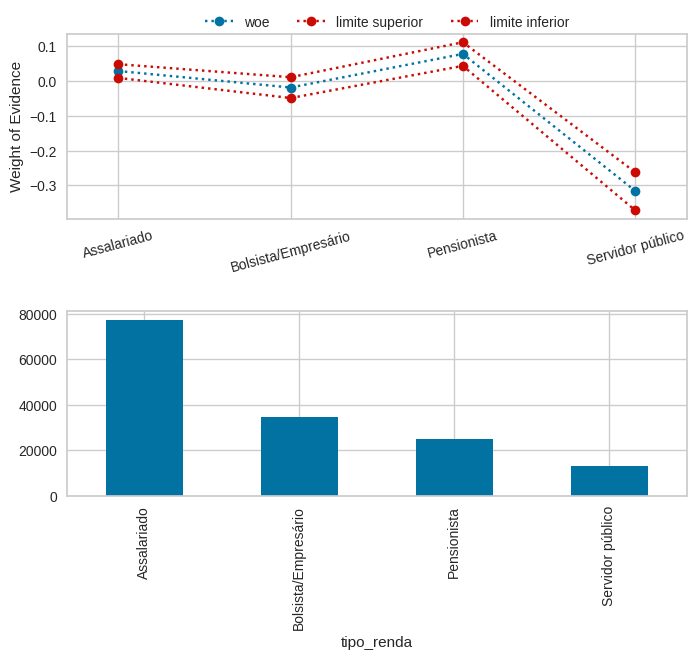

In [24]:
df_val['tipo_renda'].replace({'Bolsista': 'Bolsista/Empresário',
                              'Empresário': 'Bolsista/Empresário'}, inplace=True)

biv_discreta('tipo_renda', df_val)
IV(df_val['tipo_renda'], df_val['mau'])


0.009265199923382221

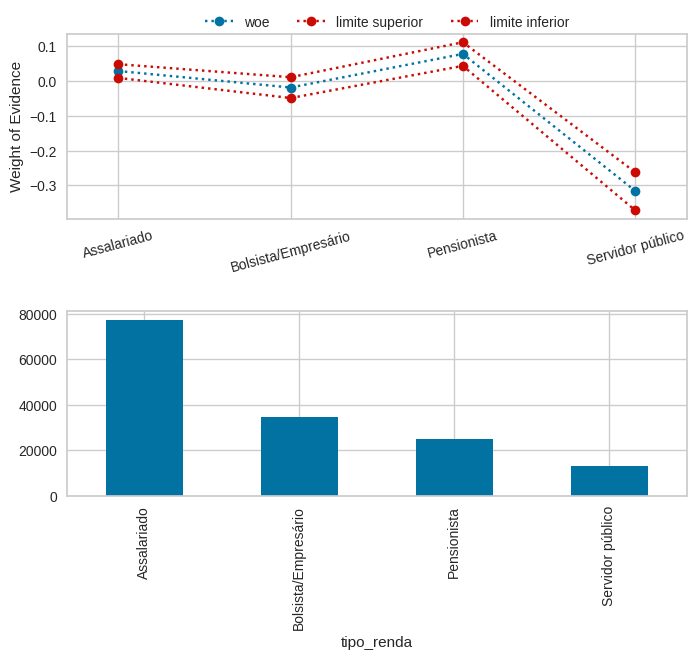

In [25]:
df_val['tipo_renda'] = df_val['tipo_renda'].replace({'Bolsista': 'Bolsista/Empresário',
                                                     'Empresário': 'Bolsista/Empresário'})

biv_discreta('tipo_renda', df_val)
IV(df_val['tipo_renda'], df_val['mau'])


,qt_bom,qt_mau,mau,qtd_filhos,cont,ep,mau_sup,mau_inf,logit,logit_sup,logit_inf,woe,woe_sup,woe_inf
qtd_filhos,,,,,,,,,,,,,,
0,477683,39648,0.076640,0,517331,0.000370,0.077364,0.075915,-2.488907,-2.478707,-2.499195,-0.021719,-0.011519,-0.032007
1,140345,12676,0.082838,1,153021,0.000705,0.084219,0.081457,-2.404393,-2.386352,-2.422710,0.062795,0.080836,0.044478
2,64142,5490,0.078843,2,69632,0.001021,0.080845,0.076841,-2.458171,-2.430924,-2.486058,0.009017,0.036264,-0.018870
3+,9187,829,0.082768,3+,10016,0.002753,0.088164,0.077371,-2.405325,-2.336259,-2.478616,0.061864,0.130929,-0.011428


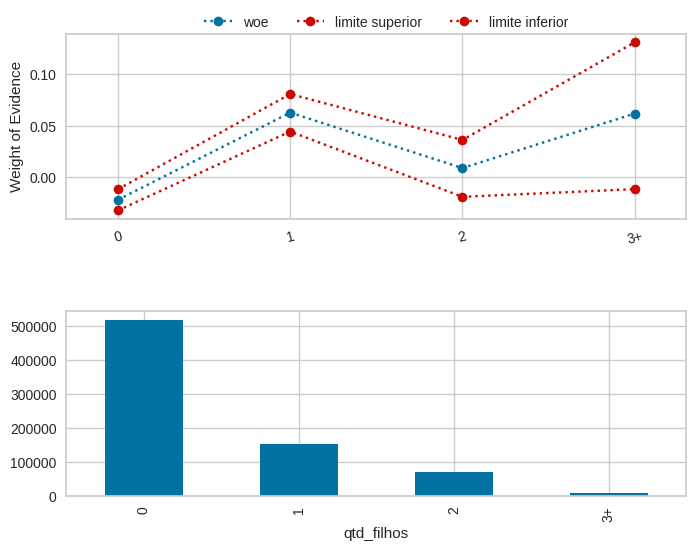

In [26]:
df3= df.copy()
df3['qtd_filhos'] = df3['qtd_filhos'].apply(lambda x: '3+' if x >= 3 else str(x))
biv_discreta('qtd_filhos', df3)

,qt_bom,qt_mau,mau,qt_pessoas_residencia,cont,ep,mau_sup,mau_inf,logit,logit_sup,logit_inf,woe,woe_sup,woe_inf
qt_pessoas_residencia,,,,,,,,,,,,,,
1.0,124842,10926,0.080476,1.0,135768,0.000738,0.081923,0.079029,-2.435904,-2.416508,-2.455620,0.031284,0.050680,0.011568
2.0,377007,30769,0.075456,2.0,407776,0.000414,0.076266,0.074645,-2.505756,-2.494192,-2.517434,-0.038568,-0.027004,-0.050246
3.0,119168,10900,0.083802,3.0,130068,0.000768,0.085308,0.082296,-2.391771,-2.372317,-2.411547,0.075417,0.094871,0.055642
4+,70340,6048,0.079175,4+,76388,0.000977,0.081090,0.077260,-2.453613,-2.427635,-2.480172,0.013575,0.039553,-0.012984


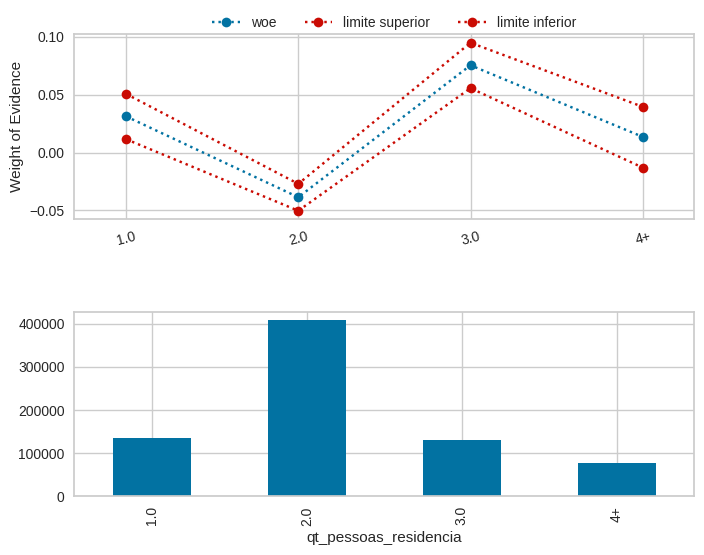

In [27]:
df4= df.copy()
df4['qt_pessoas_residencia'] = df4['qt_pessoas_residencia'].apply(lambda x: '4+' if x >= 4 else str(x))
biv_discreta('qt_pessoas_residencia', df4)

## Fazendo um equação para o modelo

In [28]:
# ajuda para definir a equação da regressão
' + '.join(list(df_val.columns))

'index + sexo + posse_de_veiculo + posse_de_imovel + qtd_filhos + tipo_renda + educacao + estado_civil + tipo_residencia + idade + tempo_emprego + qt_pessoas_residencia + renda + mau + mes + bom'

In [29]:
import statsmodels.formula.api as smf
import statsmodels.api as sm

formula = """
mau ~ sexo + posse_de_veiculo + posse_de_imovel + qtd_filhos +
        tipo_renda + educacao + estado_civil + tipo_residencia +
        idade + tempo_emprego + qt_pessoas_residencia + renda
"""

rl = smf.glm(formula, data=df_val, family=sm.families.Binomial()).fit()

rl.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                      Generalized Linear Model Regression Results                      
=======================================================================================
Dep. Variable:     ['mau[False]', 'mau[True]']   No. Observations:               150000
Model:                                     GLM   Df Residuals:                   149975
Model Family:                         Binomial   Df Model:                           24
Link Function:                           Logit   Scale:                          1.0000
Method:                                   IRLS   Log-Likelihood:                -57166.
Date:                         Sat, 22 Feb 2025   Deviance:                   1.1433e+05
Time:                                 01:57:32   Pearson chi2:                 1.40e+16
No. Iterations:                             10   Pseudo R-squ. (CS):            0.06905
Covariance Type:                     nonrobust                                         
=====================================================================================================
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Intercept                             0.6875      0.286      2.408      0.016       0.128       1.247
sexo[T.M]                             0.1368      0.018      7.654      0.000       0.102       0.172
posse_de_veiculo[T.S]                -0.0106      0.017     -0.626      0.531      -0.044       0.023
posse_de_imovel[T.S]                  0.1071      0.016      6.590      0.000       0.075       0.139
tipo_renda[T.Bolsista/Empresário]     0.0483      0.019      2.521      0.012       0.011       0.086
tipo_renda[T.Pensionista]             0.0318      0.028      1.152      0.249      -0.022       0.086
tipo_renda[T.Servidor público]        0.0255      0.031      0.815      0.415      -0.036       0.087
educacao[T.Médio]                     0.1585      0.066      2.412      0.016       0.030       0.287
educacao[T.Pós graduação]             0.7551      0.275      2.748      0.006       0.217       1.294
educacao[T.Superior completo]         0.2184      0.067      3.254      0.001       0.087       0.350
educacao[T.Superior incompleto]       0.2012      0.075      2.670      0.008       0.053       0.349
estado_civil[T.Separado]             -0.1855      0.138     -1.344      0.179      -0.456       0.085
estado_civil[T.Solteiro]             -0.1529      0.135     -1.130      0.258      -0.418       0.112
estado_civil[T.União]                 0.0066      0.028      0.233      0.815      -0.049       0.062
estado_civil[T.Viúvo]                -0.0886      0.140     -0.632      0.527      -0.363       0.186
tipo_residencia[T.Casa]               0.0251      0.062      0.405      0.685      -0.097       0.147
tipo_residencia[T.Com os pais]        0.0204      0.070      0.292      0.771      -0.117       0.157
tipo_residencia[T.Comunitário]        0.2557      0.130      1.960      0.050   -2.03e-05       0.511
tipo_residencia[T.Estúdio]            0.0851      0.115      0.742      0.458      -0.140       0.310
tipo_residencia[T.Governamental]     -0.0387      0.074     -0.520      0.603      -0.184       0.107
qtd_filhos                            0.1481      0.134      1.101      0.271      -0.115       0.412
idade                                 0.0010      0.001      0.991      0.322      -0.001       0.003
tempo_emprego                         0.0285      0.003     11.156      0.000       0.024       0.034
qt_pessoas_residencia                -0.1449      0.134     -1.080      0.280      -0.408       0.118
renda                                 0.0002   4.41e-06     55.043      0.000       0.000       0.000
=====================================================================================================
"""

In [30]:
# Ordena metadados por Information Value
metadados.sort_values(by='IV', ascending=False) # Pegar as variáveis que possuem iv>1%

,dtype,nmissing,valores_unicos,papel,IV
renda,float64,0.0,142419.0,covariavel,1.068628
tempo_emprego,float64,125957.0,3004.0,covariavel,0.351920
idade,int64,0.0,47.0,covariavel,0.017968
posse_de_imovel,object,0.0,2.0,covariavel,0.009693
tipo_renda,object,0.0,5.0,covariavel,0.009360
educacao,object,0.0,5.0,covariavel,0.003547
tipo_residencia,object,0.0,6.0,covariavel,0.003045
index,int64,0.0,16650.0,covariavel,0.002664
sexo,object,0.0,2.0,covariavel,0.002185
qt_pessoas_residencia,float64,0.0,9.0,covariavel,0.001346


In [31]:
import statsmodels.formula.api as smf
import statsmodels.api as sm

formula = """
mau ~ sexo + qtd_filhos +
        tipo_renda + educacao  + idade +
        tempo_emprego + renda
"""

rl = smf.glm(formula, data=df_val, family=sm.families.Binomial()).fit()

rl.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                      Generalized Linear Model Regression Results                      
=======================================================================================
Dep. Variable:     ['mau[False]', 'mau[True]']   No. Observations:               150000
Model:                                     GLM   Df Residuals:                   149987
Model Family:                         Binomial   Df Model:                           12
Link Function:                           Logit   Scale:                          1.0000
Method:                                   IRLS   Log-Likelihood:                -57194.
Date:                         Sat, 22 Feb 2025   Deviance:                   1.1439e+05
Time:                                 01:57:35   Pearson chi2:                 1.42e+16
No. Iterations:                             10   Pseudo R-squ. (CS):            0.06870
Covariance Type:                     nonrobust                                         
=====================================================================================================
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Intercept                             0.4685      0.077      6.077      0.000       0.317       0.620
sexo[T.M]                             0.1284      0.017      7.691      0.000       0.096       0.161
tipo_renda[T.Bolsista/Empresário]     0.0485      0.019      2.538      0.011       0.011       0.086
tipo_renda[T.Pensionista]             0.0412      0.027      1.506      0.132      -0.012       0.095
tipo_renda[T.Servidor público]        0.0259      0.031      0.827      0.408      -0.035       0.087
educacao[T.Médio]                     0.1421      0.066      2.166      0.030       0.014       0.271
educacao[T.Pós graduação]             0.7708      0.275      2.807      0.005       0.233       1.309
educacao[T.Superior completo]         0.2030      0.067      3.031      0.002       0.072       0.334
educacao[T.Superior incompleto]       0.1798      0.075      2.391      0.017       0.032       0.327
qtd_filhos                            0.0072      0.011      0.660      0.509      -0.014       0.029
idade                                 0.0017      0.001      1.829      0.067      -0.000       0.004
tempo_emprego                         0.0272      0.003     10.704      0.000       0.022       0.032
renda                                 0.0002    4.4e-06     55.882      0.000       0.000       0.000
=====================================================================================================
"""

## Categorias Insignificantes

- tipo_renda[T.Bolsista] (p = 0.491) → Alto p-valor, coeficiente pequeno, intervalo de confiança grande.
- tipo_renda[T.Pensionista] (p = 0.625) → Ainda menos significativo, possivelmente dispensável.
- educacao[T.Médio] (p = 0.427) → P-valor alto e coeficiente pequeno.
- educacao[T.Pós graduação] (p = 0.072) → Está perto de ser significativo, mas ainda acima de 0.05.
- educacao[T.Superior incompleto] (p = 0.180) → P-valor alto, intervalo de confiança cruzando zero.
- qtd_filhos (p = 0.516) → Muito pouco impacto, coeficiente próximo de zero.

## Avaliação do modelo

Avalie o poder discriminante do modelo pelo menos avaliando acurácia, KS e Gini.

Avalie estas métricas nas bases de desenvolvimento e *out of time*.

In [32]:
import statsmodels.formula.api as smf
import statsmodels.api as sm

# Convertendo colunas categóricas para o formato adequado
categorical_cols = ['sexo', 'posse_de_veiculo', 'posse_de_imovel', 'tipo_renda',
                    'educacao', 'estado_civil', 'tipo_residencia']
df_val[categorical_cols] = df_val[categorical_cols].astype('category')

# Definição da fórmula
formula = """
mau ~ sexo + posse_de_veiculo + posse_de_imovel + qtd_filhos +
        tipo_renda + educacao + estado_civil + tipo_residencia +
        idade + tempo_emprego + qt_pessoas_residencia + renda
"""

# Treinando o modelo
rl = smf.glm(formula, data=df_val, family=sm.families.Binomial()).fit()

# Fazendo a predição
df_val = df_val.copy()  # Garante que estamos modificando uma cópia do DataFrame original
df_val["score"] = rl.predict(df_val)

# Avaliação do modelo
from sklearn import metrics
from scipy.stats import ks_2samp

# Acurácia
acc = metrics.accuracy_score(df_val.mau, df_val.score > 0.068)

# AUC
fpr, tpr, thresholds = metrics.roc_curve(df_val.mau, df_val.score)
auc = metrics.auc(fpr, tpr)

# Gini
gini = 2 * auc - 1

# KS
ks = ks_2samp(df_val.loc[df_val.mau == 1, 'score'], df_val.loc[df_val.mau != 1, 'score']).statistic

# Exibindo as métricas
print('Acurácia: {0:.1%} \nAUC: {1:.1%} \nGINI: {2:.1%}\nKS: {3:.1%}'
      .format(acc, auc, gini, ks))


Acurácia: 14.7% 
AUC: 26.7% 
GINI: -46.6%
KS: 34.2%


In [33]:
def perfil_var(df, var, ev='mau', score='score', ncat=None):

    _df = df.copy()
    _df['ev'] = _df[ev]
    _df['nev'] = 1 - _df[ev]

    if ncat == None:
        g = _df.groupby(var)
    else:
        g = _df.groupby(pd.qcut(_df[var], ncat, duplicates='drop'), observed=False)

    tg = g.agg({score:'mean', 'ev':'sum', 'nev':'sum'})
    tg['total'] = tg.ev + tg.nev
    tg['distribuição'] = tg.total/tg.total.sum()

    tg['total_acum'] = tg['total'].cumsum()
    tg['ev_acum']    = tg.ev.cumsum()
    tg['nev_acum']   = tg.nev.cumsum()

    tg['tx_ev']     = tg.ev/tg.total
    tg['ep']        = (tg.tx_ev*(1-tg.tx_ev)/tg.total)**.5
    tg['tx_ev_sup'] = tg.score+t.ppf([0.025], tg.total-1)*tg.ep
    tg['tx_ev_inf'] = tg.score+t.ppf([0.975], tg.total-1)*tg.ep

    fig, ax = plt.subplots()

    if ncat == None:
        ax.plot(tg.reset_index()[var], tg.reset_index(drop=True).score    , 'b-' , label='esperado')
        ax.plot(tg.reset_index()[var], tg.reset_index(drop=True).tx_ev    , 'r--', label='observado')
        ax.plot(tg.reset_index()[var], tg.reset_index(drop=True).tx_ev_sup, 'r:',  label='obs-ls')
        ax.plot(tg.reset_index()[var], tg.reset_index(drop=True).tx_ev_inf, 'r:',  label='obs-li')
    else:
        tg[var+'_med'] = g[var].mean()
        ax.plot(tg[var+'_med'], tg.reset_index(drop=True).score    , 'b-' , label='esperado')
        ax.plot(tg[var+'_med'], tg.reset_index(drop=True).tx_ev    , 'r--', label='observado')
        ax.plot(tg[var+'_med'], tg.reset_index(drop=True).tx_ev_sup, 'r:',  label='obs-ls')
        ax.plot(tg[var+'_med'], tg.reset_index(drop=True).tx_ev_inf, 'r:',  label='obs-li')
    return tg[['distribuição', score, 'tx_ev']]



,tempo_emprego,distribuição,score,tx_ev
0,"(0.11699999999999999, 2.936]",20.0%,78.0%,23.3%
1,"(2.936, 5.759]",20.0%,81.7%,17.7%
2,"(5.759, 7.749]",28.1%,84.7%,14.8%
3,"(7.749, 10.471]",11.8%,88.0%,11.2%
4,"(10.471, 42.907]",20.0%,95.6%,4.8%


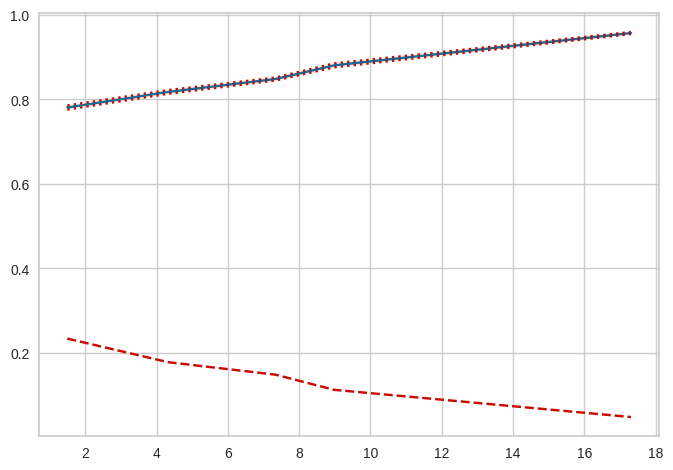

In [34]:
tg = perfil_var(df_val, 'tempo_emprego', ncat=5)
tg.reset_index().style.format({'score':'{:.1%}', 'tx_ev':'{:.1%}', 'distribuição':'{:.1%}'})

,distribuição,score,tx_ev
idade,,,
"(21.999, 33.0]",0.222740,0.823738,0.175212
"(33.0, 40.0]",0.208947,0.851258,0.150150
"(40.0, 47.0]",0.190773,0.863084,0.137091
"(47.0, 55.0]",0.182933,0.875926,0.123251
"(55.0, 68.0]",0.194607,0.858640,0.141653


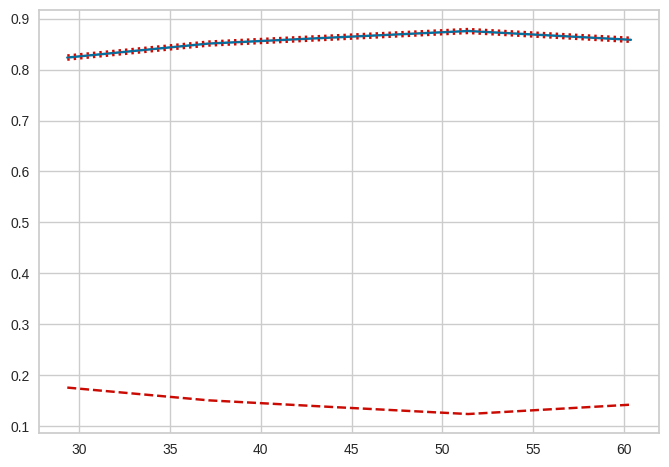

In [35]:
tg = perfil_var(df_val, 'idade', ncat=5)
tg

In [36]:
df3 = df_val.sort_values(by='score').reset_index().copy()
df3['tx_mau_acum'] = df3.mau.cumsum()/df3.shape[0]

df3['pct_mau_acum'] = df3.mau.cumsum()/df3.mau.sum()
df3['red_mau_acum'] = 1-df3.pct_mau_acum

df3['pct_aprovacao'] = np.array(range(df3.shape[0]))/df3.shape[0]
df3.head()

,data_ref,index,sexo,posse_de_veiculo,posse_de_imovel,qtd_filhos,tipo_renda,educacao,estado_civil,tipo_residencia,...,qt_pessoas_residencia,renda,mau,mes,bom,score,tx_mau_acum,pct_mau_acum,red_mau_acum,pct_aprovacao
0,2016-03-01,14240,F,N,N,0,Assalariado,Fundamental,Casado,Aluguel,...,2.0,690.47,True,3,0,0.649794,0.000007,0.000045,0.999955,0.000000
1,2016-03-01,14240,F,N,N,0,Assalariado,Fundamental,Casado,Aluguel,...,2.0,690.47,True,3,0,0.649794,0.000013,0.000091,0.999909,0.000007
2,2016-03-01,10616,F,N,N,2,Assalariado,Médio,Separado,Casa,...,3.0,151.93,True,3,0,0.653806,0.000020,0.000136,0.999864,0.000013
3,2016-03-01,10616,F,N,N,2,Assalariado,Médio,Separado,Casa,...,3.0,151.93,True,3,0,0.653806,0.000027,0.000182,0.999818,0.000020
4,2016-03-01,10616,F,N,N,2,Assalariado,Médio,Separado,Casa,...,3.0,151.93,True,3,0,0.653806,0.000033,0.000227,0.999773,0.000027


In [37]:
fig = px.line(df3, x="pct_aprovacao", y="tx_mau_acum", title='Taxa de maus por %aprovação')
fig.show()

fig = px.line(df3, x="pct_aprovacao", y="red_mau_acum", title='Redução na inadimplência por %aprovação')
fig.show()

Conforme o critério de aprovação se torna mais flexível (ou seja, a % de aprovação aumenta), observa-se um crescimento na taxa acumulada de inadimplentes. Isso ocorre porque, ao expandir a aprovação para um número maior de pessoas, a probabilidade de incluir clientes com maior risco de inadimplência também aumenta.

Por outro lado, a redução na inadimplência apresenta um comportamento decrescente à medida que a taxa de aprovação cresce. Isso acontece porque, ao aprovar mais candidatos, o controle sobre a inadimplência se torna menos eficaz, uma vez que um número maior de indivíduos com risco de inadimplência passa a integrar a base aprovada.


## Verificando a taxa de aprovação por cada grupos de idade

In [38]:
tmp = df_val.sort_values(by=['educacao','score'], ascending=True).copy()
tmp['freq']=1

tmp['freq_ac'] = tmp.groupby(['educacao'],observed=False)['freq'].transform(lambda x: x.cumsum())
tmp['maus_ac'] = tmp.groupby(['educacao'],observed=False)['mau'].transform(lambda x: x.cumsum())
tmp['freq_fx_educacao'] = tmp.groupby(['educacao'],observed=False)['freq'].transform(lambda x: x.sum())

tmp['pct_aprovados'] = tmp.freq_ac/tmp['freq_fx_educacao']
tmp['tx_maus_pto_corte'] = tmp['maus_ac']/tmp['freq_ac']

tmp

,index,sexo,posse_de_veiculo,posse_de_imovel,qtd_filhos,tipo_renda,educacao,estado_civil,tipo_residencia,idade,...,mau,mes,bom,score,freq,freq_ac,maus_ac,freq_fx_educacao,pct_aprovados,tx_maus_pto_corte
data_ref,,,,,,,,,,,,,,,,,,,,,
2016-03-01,14240,F,N,N,0,Assalariado,Fundamental,Casado,Aluguel,52,...,True,3,0,0.649794,1,1,1,1674,0.000597,1.000000
2016-03-01,14240,F,N,N,0,Assalariado,Fundamental,Casado,Aluguel,52,...,True,3,0,0.649794,1,2,2,1674,0.001195,1.000000
2016-03-01,12969,F,N,N,0,Bolsista/Empresário,Fundamental,Casado,Governamental,52,...,False,3,1,0.655282,1,3,2,1674,0.001792,0.666667
2016-03-01,12969,F,N,N,0,Bolsista/Empresário,Fundamental,Casado,Governamental,52,...,False,3,1,0.655282,1,4,2,1674,0.002389,0.500000
2016-03-01,12969,F,N,N,0,Bolsista/Empresário,Fundamental,Casado,Governamental,52,...,False,3,1,0.655282,1,5,2,1674,0.002987,0.400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-01-01,1511,F,S,S,0,Assalariado,Superior incompleto,Casado,Casa,51,...,False,1,1,1.000000,1,5908,923,5912,0.999323,0.156229
2016-01-01,1511,F,S,S,0,Assalariado,Superior incompleto,Casado,Casa,51,...,False,1,1,1.000000,1,5909,923,5912,0.999493,0.156202
2016-01-01,1511,F,S,S,0,Assalariado,Superior incompleto,Casado,Casa,51,...,False,1,1,1.000000,1,5910,923,5912,0.999662,0.156176


In [39]:
fig = px.line(tmp, x="score", y="pct_aprovados", color='educacao', title='Taxa de maus por %aprovação')
fig.show()

Pessoas com ensino fundamental (linha azul) apresentam a maior taxa de inadimplência acumulada à medida que o percentual de aprovação aumenta. Por outro lado, indivíduos com pós-graduação (linha verde) exibem um comportamento mais irregular, possivelmente devido a um menor volume de dados nessa categoria. As demais categorias — ensino médio, superior completo e superior incompleto — seguem um padrão semelhante, com taxas de inadimplência intermediárias entre os dois extremos. De modo geral, observa-se uma tendência em que níveis educacionais mais baixos estão associados a maiores taxas de inadimplência.

## Fazendo uma Análise com Pycaret e Pipeline

In [40]:
dataset = pd.read_feather('credit_scoring.ftr')

In [41]:
data = dataset.sample(frac=0.95, random_state=786)
data_unseen = dataset.drop(data.index)
data.reset_index(inplace=True, drop=True)
data_unseen.reset_index(inplace=True, drop=True)
print('Conjunto de dados para modelagem (treino e teste): ' + str(data.shape))
print('Conjunto de dados não usados no treino/teste, apenas como validação: ' + str(data_unseen.shape))

Conjunto de dados para modelagem (treino e teste): (712500, 15)
Conjunto de dados não usados no treino/teste, apenas como validação: (37500, 15)


## Configurando o pycaret

In [42]:
exp_clf101 = setup(
    data=data,
    target='mau',
    session_id=123,
    remove_outliers=True,
    imputation_type='simple',
    numeric_imputation='mean',
    categorical_imputation='mode',
    categorical_features=['sexo', 'posse_de_veiculo', 'posse_de_imovel', 'tipo_renda', 'educacao', 'estado_civil', 'tipo_residencia'],  # Include 'tipo_residencia' here
    pca=True,
    pca_components=5,
    feature_selection=True
)

,Description,Value
0,Session id,123
1,Target,mau
2,Target type,Binary
3,Original data shape,"(712500, 15)"
4,Transformed data shape,"(687562, 3)"
5,Transformed train set shape,"(473811, 3)"
6,Transformed test set shape,"(213751, 3)"
7,Numeric features,6
8,Date features,1
9,Categorical features,7


# Utilizando o Pycaret na base de dados

Utilize o pycaret para pre processar os dados e rodar o modelo **lightgbm**. Faça todos os passos a passos da aula e gere os gráficos finais. E o pipeline de toda a transformação.


In [44]:
from pycaret.classification import *

# Reduzindo a base para teste (opcional)
data_sample = data.sample(frac=0.5, random_state=42)  # Reduz a amostra em 50%

# Configuração otimizada
setup(data=data_sample,
      target='mau',
      session_id=42,
      normalize=True,
      remove_outliers=False,  # Remova outliers manualmente se necessário
      use_gpu=True)  # Se houver GPU disponível

# Criando um modelo específico (mais rápido do que compare_models)
model_pycaret = create_model('lightgbm')


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset migh

,Description,Value
0,Session id,42
1,Target,mau
2,Target type,Binary
3,Original data shape,"(356250, 15)"
4,Transformed data shape,"(356250, 34)"
5,Transformed train set shape,"(249374, 34)"
6,Transformed test set shape,"(106876, 34)"
7,Numeric features,6
8,Date features,1
9,Categorical features,7


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset migh

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9218,0.7798,0.0205,0.5063,0.0394,0.0335,0.0899
1,0.9222,0.7763,0.0241,0.5529,0.0462,0.0399,0.1034
2,0.9220,0.7904,0.0272,0.5196,0.0517,0.0442,0.1054
3,0.9218,0.7805,0.0200,0.5065,0.0385,0.0327,0.0888
4,0.9221,0.7793,0.0256,0.5435,0.0490,0.0422,0.1055
5,0.9222,0.7822,0.0236,0.5610,0.0453,0.0392,0.1033
6,0.9218,0.7771,0.0241,0.4947,0.0460,0.0390,0.0959
7,0.9222,0.7786,0.0190,0.5692,0.0367,0.0318,0.0935
8,0.9216,0.7820,0.0174,0.4722,0.0336,0.0282,0.0790


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

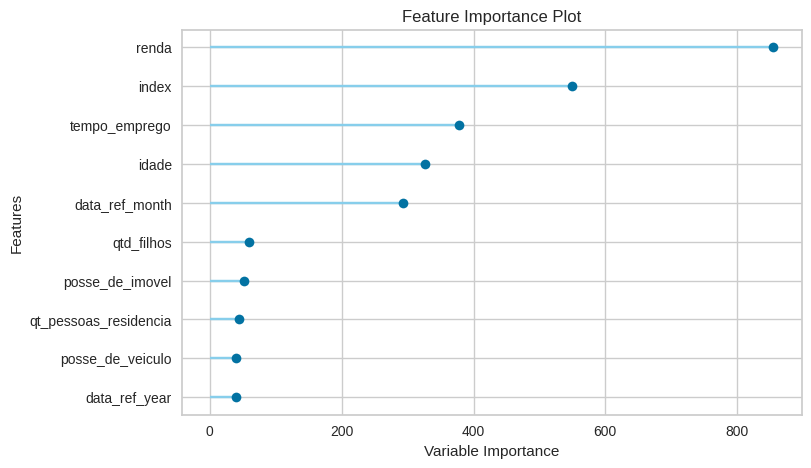

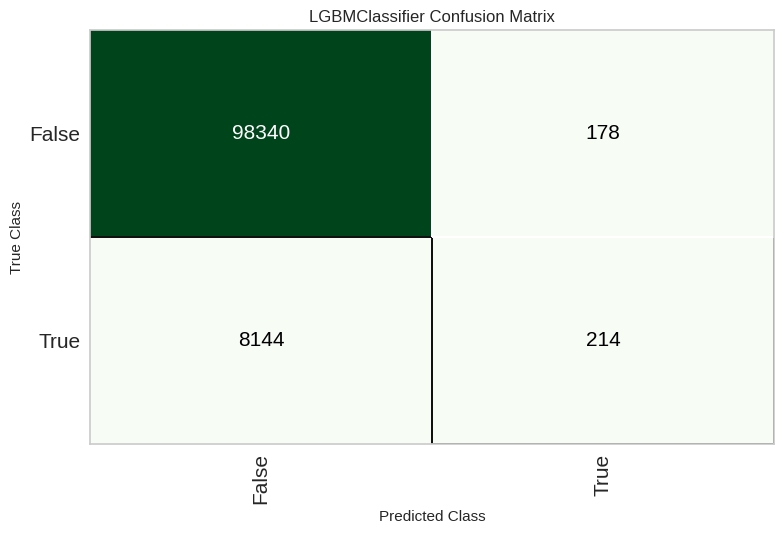

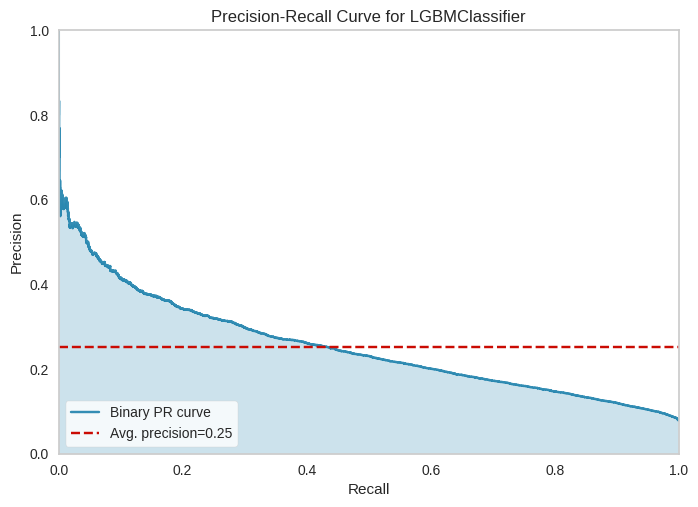

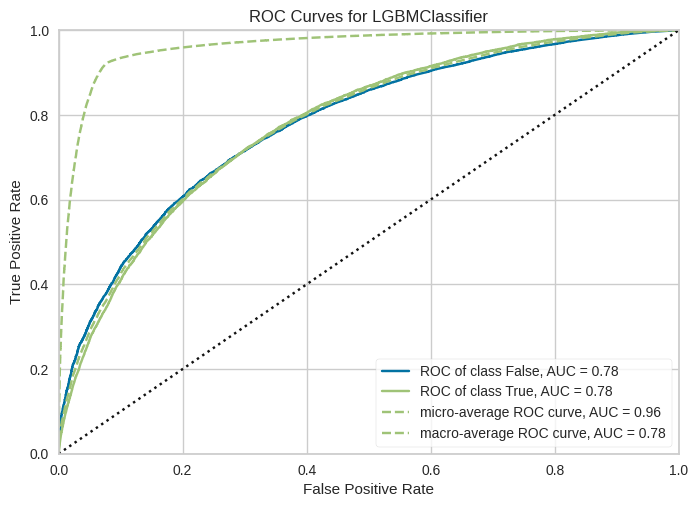

In [45]:
plot_model(model_pycaret, plot='feature')
plot_model(model_pycaret, plot = 'confusion_matrix')
plot_model(model_pycaret, plot = 'pr')
plot_model(model_pycaret, plot = 'auc')

# Predict na amostra de validação / hold-out

In [46]:
predict_model(model_pycaret);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.9221,0.7802,0.0256,0.5459,0.0489,0.0422,0.1057


# Finalizando o modelo para deploy

In [47]:
final_model = finalize_model(model_pycaret)

In [48]:
#Parâmetros finais do modelo Random Forest para deploy
print(model_pycaret)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=42, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)


In [49]:
predict_model(final_model);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.9224,0.7950,0.0106,0.7542,0.0210,0.0189,0.0837


# Predizendo o conjunto de dados que não foi usado no treino

In [50]:
unseen_predictions = predict_model(final_model, data=data_unseen)
unseen_predictions.head()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.9241,0.7830,0.0274,0.5000,0.0519,0.0444,0.1035


,data_ref,index,sexo,posse_de_veiculo,posse_de_imovel,qtd_filhos,tipo_renda,educacao,estado_civil,tipo_residencia,idade,tempo_emprego,qt_pessoas_residencia,renda,mau,prediction_label,prediction_score
0,2015-01-01,5033,F,S,S,2,Servidor público,Fundamental,Casado,Casa,38,15.643836,4.0,4758.299805,False,0,0.9378
1,2015-01-01,1219,M,N,S,1,Empresário,Médio,Casado,Casa,38,0.753425,3.0,2506.479980,False,0,0.8592
2,2015-01-01,13262,M,S,N,0,Empresário,Médio,Solteiro,Casa,44,1.260274,1.0,936.010010,False,0,0.6935
3,2015-01-01,13598,M,S,N,2,Assalariado,Médio,Casado,Casa,49,3.016438,4.0,3996.300049,False,0,0.9037
4,2015-01-01,11700,M,S,N,0,Empresário,Médio,Casado,Casa,39,0.827397,2.0,3908.919922,False,0,0.8970


# Salvando o modelo final




In [63]:
save_model(final_model,'LGBM 02 2025')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('date_feature_extractor',
                  TransformerWrapper(exclude=None, include=['data_ref'],
                                     transformer=ExtractDateTimeFeatures(features=['day',
                                                                                   'month',
                                                                                   'year']))),
                 ('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['index', 'qtd_filhos', 'idade',
                                              'tempo_emprego',
                                              'qt_pessoas_residencia', 'renda'],
                                     transformer=Sim...
                  LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                 colsample_bytree=1.0, importance_type='split',
                                 learning_ra

In [64]:
final_model.named_steps

{'date_feature_extractor': TransformerWrapper(exclude=None, include=['data_ref'],
                    transformer=ExtractDateTimeFeatures(features=['day', 'month',
                                                                  'year'])),
 'numerical_imputer': TransformerWrapper(exclude=None,
                    include=['index', 'qtd_filhos', 'idade', 'tempo_emprego',
                             'qt_pessoas_residencia', 'renda'],
                    transformer=SimpleImputer(add_indicator=False, copy=True,
                                              fill_value=None,
                                              keep_empty_features=False,
                                              missing_values=nan,
                                              strategy='mean')),
 'categorical_imputer': TransformerWrapper(exclude=None,
                    include=['sexo', 'posse_de_veiculo', 'posse_de_imovel',
                             'tipo_renda', 'educacao', 'estado_civil',
             

## **Conclusão**

Neste projeto, desenvolvemos um modelo de **credit scoring** para auxiliar na concessão de crédito, utilizando um conjunto de dados estruturado em 15 safras e analisando 12 meses de performance dos clientes. A abordagem adotada permitiu identificar padrões de comportamento financeiro e prever a capacidade de adimplência dos solicitantes.

Os resultados indicaram que a modelagem preditiva pode contribuir significativamente para a gestão de risco, proporcionando insights valiosos para a tomada de decisão. O modelo apresentou um desempenho satisfatório, com uma boa capacidade de distinguir clientes com maior e menor probabilidade de inadimplência. No entanto, observou-se que o desempenho poderia ser aprimorado em alguns segmentos específicos, especialmente em casos onde o histórico de crédito era limitado ou inconsistência nas informações cadastrais impactavam a previsão.

Ao segmentar os clientes com base em seus perfis de risco, as instituições financeiras podem otimizar suas estratégias de concessão de crédito e mitigar perdas financeiras. O modelo provou ser uma ferramenta valiosa para auxiliar na tomada de decisão, mas melhorias podem ser implementadas para aumentar sua robustez e precisão.

A implementação do modelo em ambientes produtivos pode ser um passo futuro, aliado a técnicas de aprimoramento como **feature engineering** avançado, ajuste de hiperparâmetros e incorporação de novas fontes de dados. Testes adicionais com diferentes algoritmos também podem ajudar a melhorar a capacidade preditiva.

